In [ ]:
!pip install -q kaggle

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"israasamaali123","key":"0c5d8341308b6cb9fb897af188e973f9"}'}

In [ ]:
#create a kaggle folder
! mkdir ~/.kaggle

In [ ]:
#copy the kaggle.json to folder created
! cp kaggle.json ~/.kaggle/

In [ ]:
#permissions for the json to act
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
#to list all the datasets in kaggle
! kaggle datasets list

ref                                                           title                                               size  lastUpdated          downloadCount  voteCount  usabilityRating  
------------------------------------------------------------  -------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
lainguyn123/student-performance-factors                       Student Performance Factors                         94KB  2024-09-02 10:53:57          34040        605  1.0              
valakhorasani/mobile-device-usage-and-user-behavior-dataset   Mobile Device Usage and User Behavior Dataset       11KB  2024-09-28 20:21:12           6283        113  1.0              
abdulszz/spotify-most-streamed-songs                          Spotify Most Streamed Songs                         60KB  2024-09-07 18:23:14          13491        174  1.0              
valakhorasani/gym-members-exercise-dataset                    Gym Members E

In [ ]:
!kaggle datasets download -d vipoooool/new-plant-diseases-dataset

Dataset URL: https://www.kaggle.com/datasets/vipoooool/new-plant-diseases-dataset
License(s): copyright-authors
 99% 2.68G/2.70G [00:24<00:00, 217MB/s]
100% 2.70G/2.70G [00:24<00:00, 118MB/s]


In [ ]:
!unzip new-plant-diseases-dataset.zip -d /content/

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
  inflating: /content/new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid/Strawberry___healthy/273a7a9e-18be-4b6a-976a-fa5ffd69b731___RS_HL 4366_90deg.JPG  
  inflating: /content/new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid/Strawberry___healthy/275f8963-f4f4-4903-962b-1da716725d08___RS_HL 4780_90deg.JPG  
  inflating: /content/new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid/Strawberry___healthy/275f8963-f4f4-4903-962b-1da716725d08___RS_HL 4780_new30degFlipLR.JPG  
  inflating: /content/new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid/Strawberry___healthy/27c2aaa4-de4b-4fb1-ba8d-14d4b24b2afa___RS_HL 4665.JPG  
  inflating: /content/new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid/Strawberry___healthy/27c2aaa4-de4b-4fb1-ba8d-14d4b24b2afa___RS_HL 4

In [ ]:
!pip install torchsummary

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns

import os                       # for working with files
import numpy as np              # for numerical computationss
import pandas as pd             # for working with dataframes
import torch                    # Pytorch module
import matplotlib.pyplot as plt # for plotting informations on graph and images using tensors
import torch.nn as nn           # for creating  neural networks
from torch.utils.data import DataLoader # for dataloaders
from PIL import Image           # for checking images
import torch.nn.functional as F # for functions for calculating loss
import torchvision.transforms as transforms   # for transforming images into tensors
from torchvision.utils import make_grid       # for data checking
from torchvision.datasets import ImageFolder  # for working with classes and images
from torchsummary import summary              # for getting the summary of our model

%matplotlib inline

In [ ]:
#Data preprocessing
#Training Image Preprocessing
training_set = tf.keras.utils.image_dataset_from_directory(
'/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train',
labels="inferred",
label_mode="categorical",
class_names=None,
color_mode="rgb",
batch_size=32,
image_size=(128, 128),
shuffle=True,
seed=None,
validation_split=None,
subset=None,
interpolation="bilinear",
follow_links=False,
crop_to_aspect_ratio=False,
pad_to_aspect_ratio=False,
data_format=None,
verbose=True,
)

Found 70295 files belonging to 38 classes.


In [ ]:
#Validation Image Preprocessing
validation_set = tf.keras.utils.image_dataset_from_directory(
    '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid',
    labels="inferred",
    label_mode="categorical",
    class_names=None,
    color_mode="rgb",
    batch_size=32,
    image_size=(128, 128),
    shuffle=True,
    seed=None,
    validation_split=None,
    subset=None,
    interpolation="bilinear",
    follow_links=False,
    crop_to_aspect_ratio=False,
    pad_to_aspect_ratio=False,
    data_format=None,
    verbose=True,
)

Found 17572 files belonging to 38 classes.


In [ ]:
for x,y in training_set:
    print(x,x.shape)
    print(y,y.shape)
    break

tf.Tensor(
[[[[113.   107.   109.  ]
   [115.25 109.25 111.25]
   [114.5  108.5  110.5 ]
   ...
   [101.    95.    97.  ]
   [122.75 116.75 118.75]
   [118.5  112.5  114.5 ]]

  [[112.25 106.25 108.25]
   [106.25 100.25 102.25]
   [126.75 120.75 122.75]
   ...
   [113.25 107.25 109.25]
   [116.5  110.5  112.5 ]
   [120.   114.   116.  ]]

  [[106.5  100.5  102.5 ]
   [111.5  105.5  107.5 ]
   [124.   118.   120.  ]
   ...
   [118.25 112.25 114.25]
   [122.   116.   118.  ]
   [116.25 110.25 112.25]]

  ...

  [[158.   157.   163.  ]
   [156.5  155.5  161.5 ]
   [156.   155.   161.  ]
   ...
   [162.25 165.25 172.25]
   [169.75 172.75 179.75]
   [167.   170.   177.  ]]

  [[154.25 153.25 159.25]
   [153.5  152.5  158.5 ]
   [154.   153.   159.  ]
   ...
   [160.75 163.75 170.75]
   [164.5  167.5  174.5 ]
   [168.5  171.5  178.5 ]]

  [[154.5  153.5  159.5 ]
   [153.75 152.75 158.75]
   [155.   154.   160.  ]
   ...
   [166.25 169.25 176.25]
   [165.25 168.25 175.25]
   [165.25 168.25 17

In [ ]:
data_dir = '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)'
train_dir = data_dir + "/train"
valid_dir = data_dir + "/valid"

In [ ]:
# printing the disease names
diseases = os.listdir(train_dir)
print(diseases)

['Soybean___healthy', 'Squash___Powdery_mildew', 'Orange___Haunglongbing_(Citrus_greening)', 'Grape___healthy', 'Peach___Bacterial_spot', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___Black_rot', 'Apple___Apple_scab', 'Cherry_(including_sour)___healthy', 'Tomato___Tomato_mosaic_virus', 'Corn_(maize)___healthy', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Potato___Early_blight', 'Apple___healthy', 'Potato___healthy', 'Strawberry___healthy', 'Tomato___Early_blight', 'Tomato___Septoria_leaf_spot', 'Pepper,_bell___healthy', 'Potato___Late_blight', 'Grape___Esca_(Black_Measles)', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Tomato___Target_Spot', 'Corn_(maize)___Northern_Leaf_Blight', 'Blueberry___healthy', 'Strawberry___Leaf_scorch', 'Tomato___healthy', 'Tomato___Bacterial_spot', 'Peach___healthy', 'Corn_(maize)___Common_rust_', 'Tomato___Late_blight', 'Raspberry___healthy', 'Pepper,_bell___Bacterial_spot', 'Tomato___Leaf_Mold',

In [ ]:
# printing the disease names
print(diseases)

['Soybean___healthy', 'Squash___Powdery_mildew', 'Orange___Haunglongbing_(Citrus_greening)', 'Grape___healthy', 'Peach___Bacterial_spot', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___Black_rot', 'Apple___Apple_scab', 'Cherry_(including_sour)___healthy', 'Tomato___Tomato_mosaic_virus', 'Corn_(maize)___healthy', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Potato___Early_blight', 'Apple___healthy', 'Potato___healthy', 'Strawberry___healthy', 'Tomato___Early_blight', 'Tomato___Septoria_leaf_spot', 'Pepper,_bell___healthy', 'Potato___Late_blight', 'Grape___Esca_(Black_Measles)', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Tomato___Target_Spot', 'Corn_(maize)___Northern_Leaf_Blight', 'Blueberry___healthy', 'Strawberry___Leaf_scorch', 'Tomato___healthy', 'Tomato___Bacterial_spot', 'Peach___healthy', 'Corn_(maize)___Common_rust_', 'Tomato___Late_blight', 'Raspberry___healthy', 'Pepper,_bell___Bacterial_spot', 'Tomato___Leaf_Mold',

In [ ]:
plants = []
NumberOfDiseases = 0
for plant in diseases:
    if plant.split('___')[0] not in plants:
        plants.append(plant.split('___')[0])
    if plant.split('___')[1] != 'healthy':
        NumberOfDiseases += 1

In [ ]:
# unique plants in the dataset
print(f"Unique Plants are: \n{plants}")

Unique Plants are: 
['Soybean', 'Squash', 'Orange', 'Grape', 'Peach', 'Apple', 'Cherry_(including_sour)', 'Tomato', 'Corn_(maize)', 'Potato', 'Strawberry', 'Pepper,_bell', 'Blueberry', 'Raspberry']


In [ ]:
# number of unique plants
print("Number of plants: {}".format(len(plants)))

Number of plants: 14


In [ ]:
# number of unique diseases
print("Number of diseases: {}".format(NumberOfDiseases))

Number of diseases: 26


In [ ]:
# Number of images for each disease
nums = {}
for disease in diseases:
    nums[disease] = len(os.listdir(train_dir + '/' + disease))

# converting the nums dictionary to pandas dataframe passing index as plant name and number of images as column

img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["no. of images"])
img_per_class

,no. of images
Soybean___healthy,2022
Squash___Powdery_mildew,1736
Orange___Haunglongbing_(Citrus_greening),2010
Grape___healthy,1692
Peach___Bacterial_spot,1838
Grape___Leaf_blight_(Isariopsis_Leaf_Spot),1722
Grape___Black_rot,1888
Apple___Apple_scab,2016
Cherry_(including_sour)___healthy,1826
Tomato___Tomato_mosaic_virus,1790


Text(0.5, 1.0, 'Images per each class of plant disease')

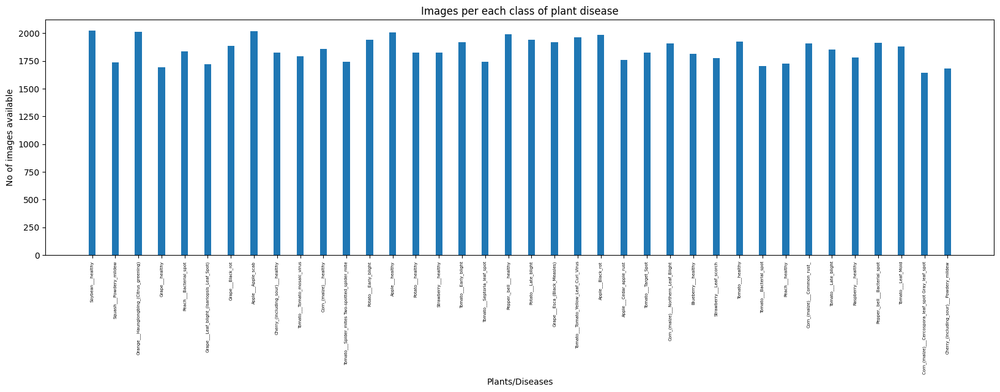

In [ ]:
# plotting number of images available for each disease
index = [n for n in range(38)]
plt.figure(figsize=(20, 5))
plt.bar(index, [n for n in nums.values()], width=0.3)
plt.xlabel('Plants/Diseases', fontsize=10)
plt.ylabel('No of images available', fontsize=10)
plt.xticks(index, diseases, fontsize=5, rotation=90)
plt.title('Images per each class of plant disease')

In [ ]:
# datasets for validation and training
#transforms.ToTensor() converts images to PyTorch tensors and scales the pixel values from the range [0, 255] (common for images) to the range [0, 1], which is required for many neural network architectures in PyTorch.
train = ImageFolder(train_dir, transform=transforms.ToTensor())
valid = ImageFolder(valid_dir, transform=transforms.ToTensor())

In [ ]:
# for checking some images from training dataset
def show_image(image, label):
    print("Label :" + train.classes[label] + "(" + str(label) + ")")
    plt.imshow(image.permute(1, 2, 0))

Label :Apple___Apple_scab(0)


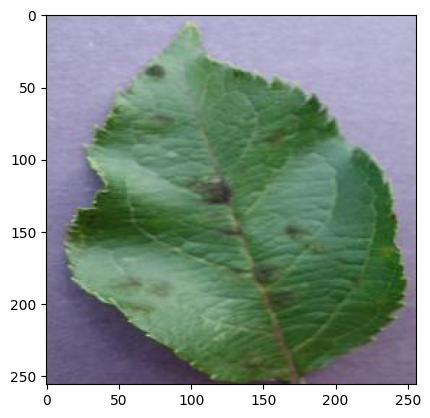

In [ ]:
show_image(*train[0])

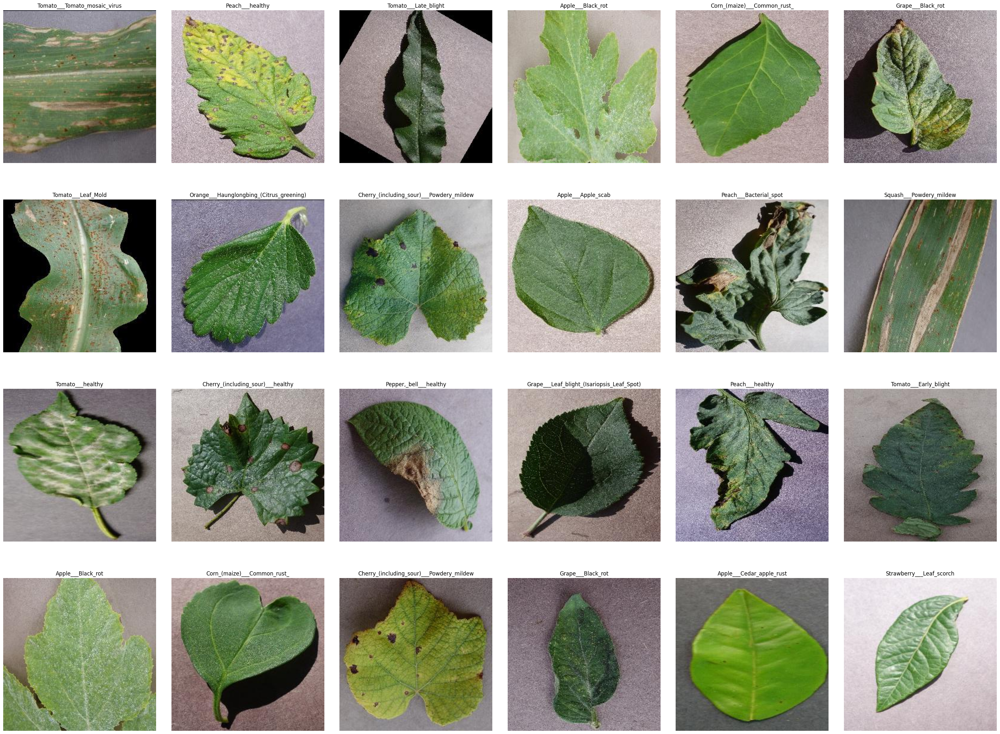

In [ ]:
# Visualize Images :)
import cv2
plt.figure(figsize=(40,30))#Set figure size to 40 inches in width and 30 inches in height
plt.subplots_adjust(wspace=0.1,hspace=0.1)# width and height space between subplots to 0.1

# Iterate over a range of 24 (to display 24 images)
for i in range(24):
    #Get a random folder index within the range of available folders in the training data
    random_folder = np.random.randint(0, len(os.listdir(train_dir)))
    #Get the path of the randomly selected folder
    random_folder_path = os.path.join(train_dir, os.listdir(train_dir)[random_folder])
    #Get a random image index within the range of available images in the selected folder
    random_image = np.random.randint(0, len(os.listdir(random_folder_path)))

    #Get the path of the randomly selected image and Read the image using OpenCV
    random_image_path = os.path.join(random_folder_path, os.listdir(random_folder_path)[random_image])
    image = cv2.imread(random_image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) #Convert the image from (BGR to RGB)

    class_names = sorted(os.listdir("/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train"))
    #Get the class name for the current image
    class_name = class_names[random_folder]

    # Create a subplot with 4 rows and 6 columns, and set the current subplot index
    plt.subplot(4, 6, i + 1)
    plt.imshow(image)#Display the image
    plt.axis("off")#Turn off the axis
    plt.title(class_name)#Set the title of the subplot to the class name

# Display the entire plot
plt.show()

In [ ]:
#Building Model
cnn = tf.keras.models.Sequential()

In [ ]:
#Building Convolution Layer
cnn.add(tf.keras.layers.Conv2D(filters=32,kernel_size=3,padding='same',activation='relu',input_shape=[128,128,3]))
cnn.add(tf.keras.layers.Conv2D(filters=32,kernel_size=3,activation='relu'))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2,strides=2))

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
#Building Convolution Layer
cnn.add(tf.keras.layers.Conv2D(filters=64,kernel_size=3,padding='same',activation='relu'))
cnn.add(tf.keras.layers.Conv2D(filters=64,kernel_size=3,activation='relu'))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2,strides=2))

In [ ]:
#Building Convolution Layer
cnn.add(tf.keras.layers.Conv2D(filters=128,kernel_size=3,padding='same',activation='relu'))
cnn.add(tf.keras.layers.Conv2D(filters=128,kernel_size=3,activation='relu'))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2,strides=2))

In [ ]:
cnn.add(tf.keras.layers.Conv2D(filters=256,kernel_size=3,padding='same',activation='relu'))
cnn.add(tf.keras.layers.Conv2D(filters=256,kernel_size=3,activation='relu'))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2,strides=2))

In [ ]:
cnn.add(tf.keras.layers.Conv2D(filters=512,kernel_size=3,padding='same',activation='relu'))
cnn.add(tf.keras.layers.Conv2D(filters=512,kernel_size=3,activation='relu'))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2,strides=2))

In [ ]:
cnn.add(tf.keras.layers.Dropout(0.25))

In [ ]:
cnn.add(tf.keras.layers.Flatten())

In [ ]:
cnn.add(tf.keras.layers.Dense(units = 1500, activation = 'relu'))

In [ ]:
cnn.add(tf.keras.layers.Dropout(0.4)) #To avoid overfitting

In [ ]:
#output layer
cnn.add(tf.keras.layers.Dense(units=38,activation='softmax'))

In [ ]:
#compiling Model
cnn.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
cnn.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 128, 128, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 126, 126, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 63, 63, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 61, 61, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 30, 30, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 28, 28, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 14, 14, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 12, 12, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 6, 6, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 6, 6, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 4, 4, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 2, 2, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 2, 2, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1500)                │       3,073,500 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 1500)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 38)                  │          57,038 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,842,762 (29.92 MB)

 Trainable params: 7,842,762 (29.92 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
#Model Training
training_history = cnn.fit(x = training_set, validation_data = validation_set, epochs = 10)

Epoch 1/10
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 168s 70ms/step - accuracy: 0.4297 - loss: 2.0322 - val_accuracy: 0.8417 - val_loss: 0.4965
Epoch 2/10
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 139s 63ms/step - accuracy: 0.8436 - loss: 0.4926 - val_accuracy: 0.9123 - val_loss: 0.2713
Epoch 3/10
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 130s 59ms/step - accuracy: 0.9080 - loss: 0.2883 - val_accuracy: 0.9313 - val_loss: 0.2091
Epoch 4/10
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 130s 59ms/step - accuracy: 0.9373 - loss: 0.1922 - val_accuracy: 0.9528 - val_loss: 0.1478
Epoch 5/10
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 143s 60ms/step - accuracy: 0.9532 - loss: 0.1401 - val_accuracy: 0.9427 - val_loss: 0.1802
Epoch 6/10
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 138s 63ms/step - accuracy: 0.9619 - loss: 0.1172 - val_accuracy: 0.9594 - val_loss: 0.1280
Epoch 7/10
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 135s 59ms/step - accuracy: 0.9703 - loss: 0.0899 - val_accuracy: 0.9685 - val_loss: 0.1012
Epoch 8/10
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 138s 63ms/step - accuracy: 

In [ ]:
#Model Evaluation
train_loss, train_acc = cnn.evaluate(training_set)
print('Training accuracy:', train_acc)

2197/2197 ━━━━━━━━━━━━━━━━━━━━ 55s 25ms/step - accuracy: 0.9942 - loss: 0.0185
Training accuracy: 0.9949072003364563


In [ ]:
valid_loss , valid_acc = cnn.evaluate(validation_set)
print('Validation accuracy:',valid_acc)

550/550 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - accuracy: 0.9730 - loss: 0.0905
Validation accuracy: 0.97257000207901


In [ ]:
#Saving Model
cnn.save('trained_plant_disease_model.keras')

In [ ]:
cnn.save('trained_model.h5')

In [ ]:
training_history.history #Return Dictionary of history\

{'accuracy': [0.6235436201095581,
  0.8644569516181946,
  0.9164236187934875,
  0.9401949048042297,
  0.9557721018791199,
  0.9647201299667358,
  0.9727007746696472,
  0.9770964980125427,
  0.9786044359207153,
  0.9824596047401428],
 'loss': [1.2763909101486206,
  0.4256504774093628,
  0.2600627839565277,
  0.18317033350467682,
  0.13370051980018616,
  0.1080770269036293,
  0.08426473289728165,
  0.0707605630159378,
  0.0652395635843277,
  0.05459454655647278],
 'val_accuracy': [0.8416799306869507,
  0.9123036861419678,
  0.9313111901283264,
  0.9528226852416992,
  0.9427498579025269,
  0.9594240784645081,
  0.9684725403785706,
  0.9610175490379333,
  0.9705212712287903,
  0.97257000207901],
 'val_loss': [0.4964696168899536,
  0.2713356614112854,
  0.20905174314975739,
  0.14777560532093048,
  0.1802438646554947,
  0.12799428403377533,
  0.10117252916097641,
  0.13697083294391632,
  0.09879302233457565,
  0.09235232323408127]}

In [ ]:
#Recording History to json
import json
with open("training_hist.json","w")as f:
    json.dump(training_history.history,f)

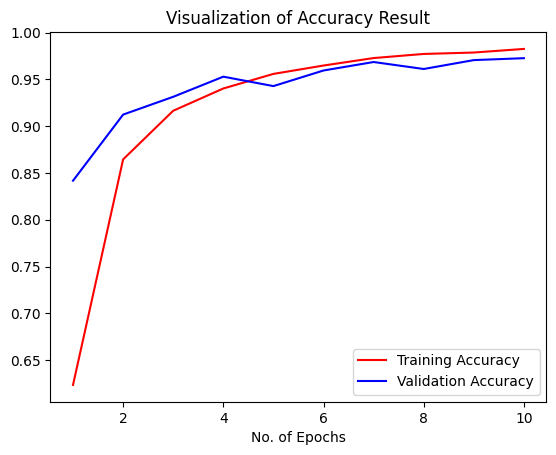

In [ ]:
#Accuraacy Visuakization
epochs = [i for i in range(1,11)]
plt.plot(epochs,training_history.history['accuracy'],color='red',label='Training Accuracy')
plt.plot(epochs,training_history.history['val_accuracy'],color='blue',label='Validation Accuracy')
plt.xlabel('No. of Epochs')
plt.title('Visualization of Accuracy Result')
plt.legend()
plt.show()

In [ ]:
#metrics for model evaluation
class_name = validation_set.class_names

In [ ]:
test_set = tf.keras.utils.image_dataset_from_directory(
    '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid',
    labels="inferred",
    label_mode="categorical",
    class_names=None,
    color_mode="rgb",
    batch_size=1,
    image_size=(128, 128),
    shuffle=False,
    seed=None,
    validation_split=None,
    subset=None,
    interpolation="bilinear",
    follow_links=False,
    crop_to_aspect_ratio=False
)

Found 17572 files belonging to 38 classes.


In [ ]:
y_pred = cnn.predict(test_set)
predicted_categories = tf.argmax(y_pred, axis=1)

17572/17572 ━━━━━━━━━━━━━━━━━━━━ 43s 2ms/step


In [ ]:
true_categories = tf.concat([y for x, y in test_set], axis=0)
Y_true = tf.argmax(true_categories, axis=1)
Y_true

<tf.Tensor: shape=(17572,), dtype=int64, numpy=array([ 0,  0,  0, ..., 37, 37, 37])>

In [ ]:
predicted_categories

<tf.Tensor: shape=(17572,), dtype=int64, numpy=array([ 0,  0,  0, ..., 37, 37, 37])>

In [ ]:
#Confusion Matrix Visualization
from sklearn.metrics import confusion_matrix,classification_report
cm = confusion_matrix(Y_true,predicted_categories)

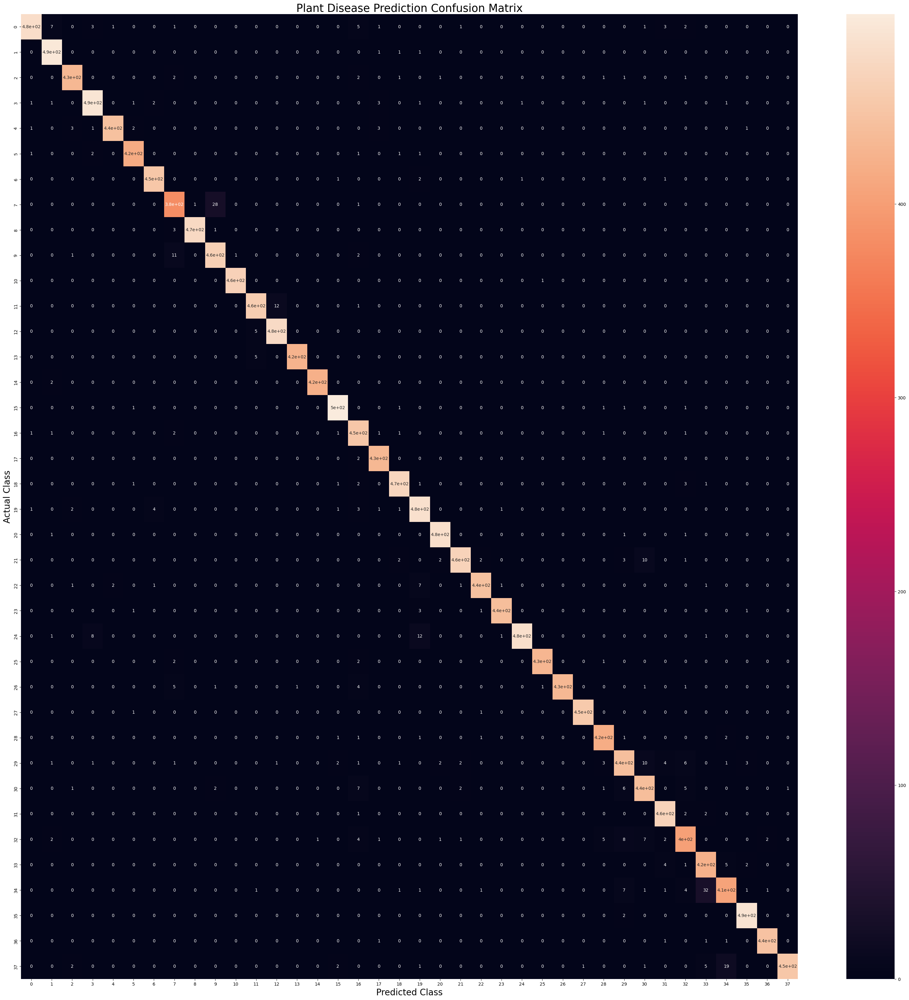

In [ ]:
plt.figure(figsize=(40, 40))
sns.heatmap(cm,annot=True,annot_kws={"size": 10})

plt.xlabel('Predicted Class',fontsize = 20)
plt.ylabel('Actual Class',fontsize = 20)
plt.title('Plant Disease Prediction Confusion Matrix',fontsize = 25)
plt.show()